# Identifying Sickle Cells in a Blood Film Using OpenCV Image Moments


# Introduction  
   
Sickle cell anaemia is a blood disorder where there is insufficient healthy red blood cells to transport oxygen. It is caused by a genetic abnormality in haemoglobin that responsible for binding and transporting oxygen throughout the body. The abnormal blood cells are rigid and sticky causing a slowing or obstruction to blood flow in small blood vessels. Most distinguishing characteristics of these cells is the presence of sickle- or crescent moon-shape cells that are easily identified in a peripheral blood smear.

The purpose of this notebook is to follow the methodology in a book chapter authored by Alzubaidi et al (2020) where MATLAB algorithms were used to identify sickle cells in blood films. Specific parameters were not provided in the publication. An image of a blood film downloaded from the internet was used for cell analysis in this notebook. It is different from the one used by the authors of the book chapter in that there was a large number of normal and abnormal (sickle) blood cells in the image. However, the main challenge for using the downloaded image is the close proximity of cells that would make segmentation of individual cells difficult. So instead of counting the number of normal vs abnormal blood cells, I focused on utilizing OpenCV methodologies, specifically Image Moments, to identify the misshapen sickle cells but not 'normal round' cells
in the blood film.

In [2]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage import measure, color, io
from skimage.segmentation import clear_border

In [3]:
#create a function to plot images using matplotlib
def plot_img (img1, img2):
    plt.figure(figsize=(15,8))
    plt.subplot(1,2,1);plt.imshow(img1)
    plt.subplot(1,2,2);plt.imshow(img2, cmap='gray')

##  Read the image

In [4]:
img = cv2.imread('./images/03-SCI-GLOBAL-articleLarge.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

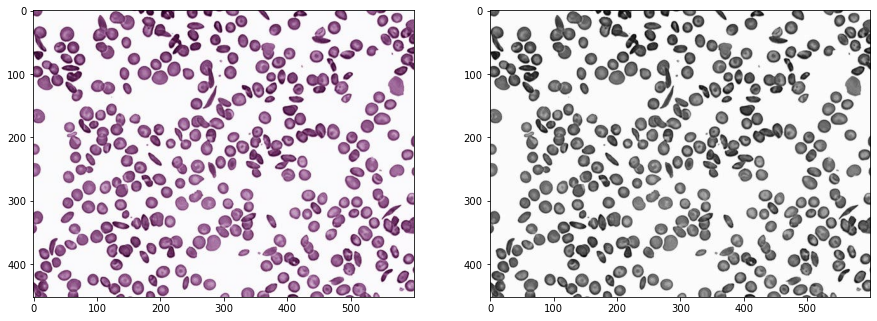

In [5]:
# compare the gray scale image
plot_img (img_rgb, img_gray)

## Smoothing the gray scale image using a Gaussian filter

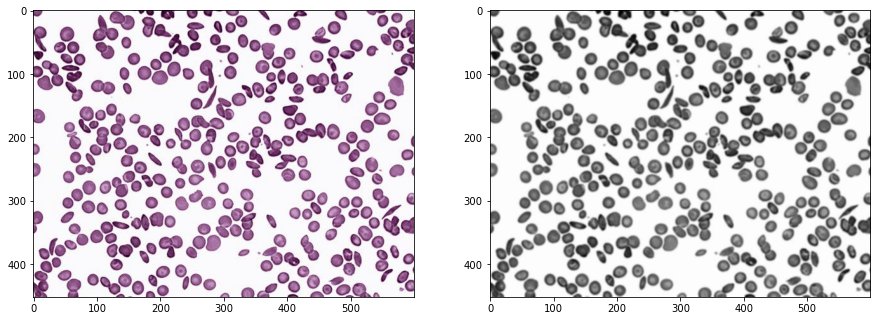

In [30]:
gblur = cv2.GaussianBlur(img_gray, ksize =(5,5), sigmaX=0)
plot_img (img_rgb, gblur)
#a median filter can also be used

## Binary thresholding

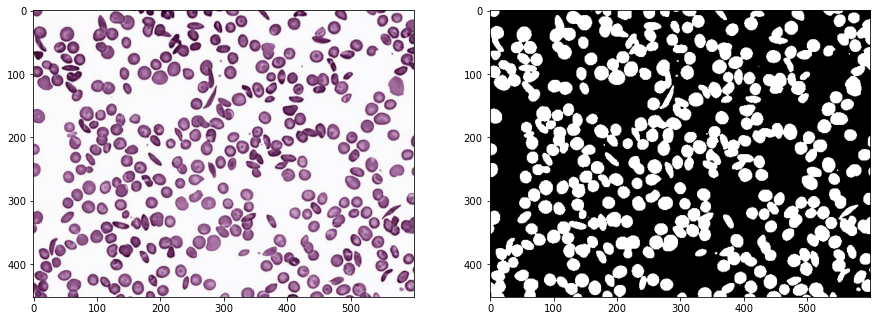

In [7]:
# use inverse binary thresholding since the backrgoudn of the original gray scale image is white (pixel value 255)
_, thresh = cv2.threshold(gblur, np.mean(gblur), 255, cv2.THRESH_BINARY_INV)
plot_img (img_rgb, thresh)

## Apply erosion
Since the cells show poor separation, contour identification of individual cells might be challenging. Application of an erosion steps may help in separating out the cells in close (but not overlapping) proximity.

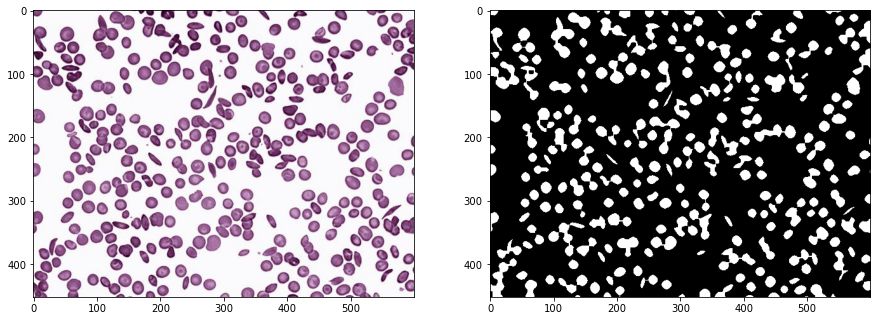

In [8]:
kernel = np.ones((3,3), np.uint8)

eroded = cv2.erode(thresh, kernel, iterations=2)

plot_img (img_rgb, eroded)

## Canny edge detection on the eroded image

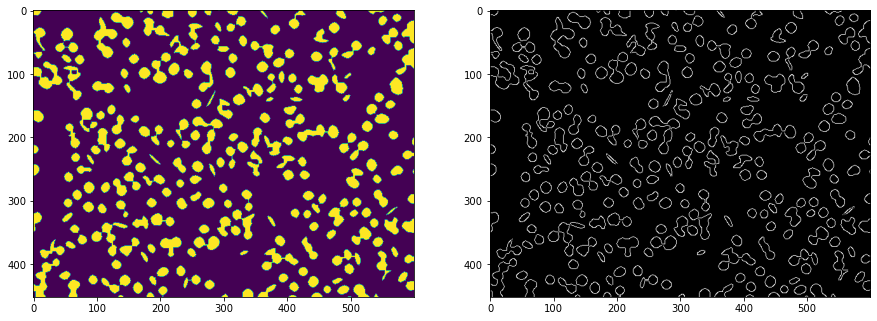

In [9]:
canny = cv2.Canny(eroded, 1, 2)
plot_img (eroded, canny)

## Eliminate cells touching the border using clear_border
Partial cells along the border may be incorrectly classified as elongated

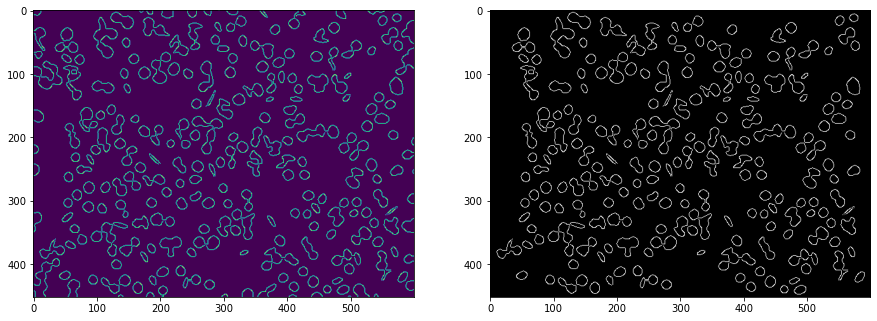

In [10]:
clr_border = clear_border(canny)
plot_img (canny, clr_border)

## Find and draw contours around all detected cells

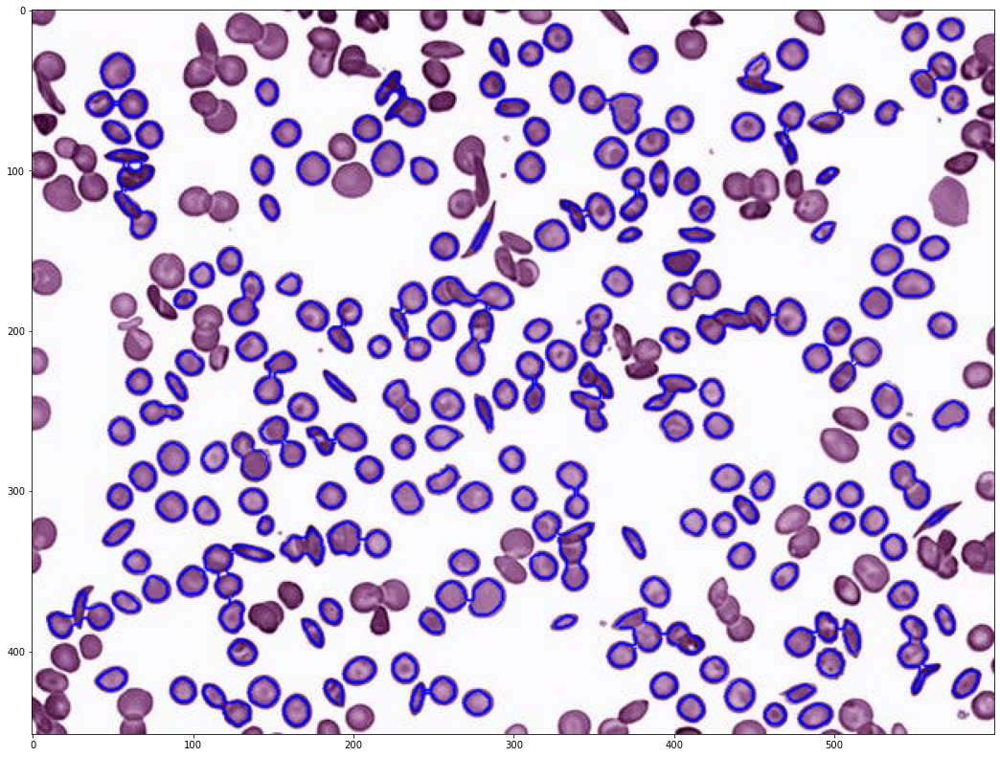

In [11]:
img_rgb2 = img_rgb.copy() #make a copy of img_rgb to draw contours on

contours,hierarchy = cv2.findContours(clr_border, 1, 2) # find contours in the clr_border image

areas = {} #create an empty dict to hold contour and area values

for i in range(len(contours)): #loop through the number of contours
    if 0<cv2.moments(contours[i])['m00']<350: #filter for areas (image moment 'm00') less than 350 pixel sq
        areas[i]= (cv2.moments(contours[i])['m00'], contours[i]) # add the contour area and contour array to the areas ditionary

for key, value in areas.items():
    cv2.drawContours(img_rgb2, [value[1]], 0, (0,0,255), thickness=1, lineType=cv2.LINE_AA) #draw each of the contours onto the original colour image
    

plt.figure(figsize=(18,15))
plt.imshow(img_rgb2)


## Determine contour lengths, contour roundness and eccentricities of the identified cells using image moments

In [12]:
#determine circularity and eccentricity of cells with contours

ecc_items = {}

for i in range(len(contours)):
    try:
        #determine the perimeter of the contours and then calculate 'roundness'
        length = cv2.arcLength(contours[i],False) #estimate the perimeter of the contour
        k = (length*length)/((cv2.moments(contours[i])['m00'])*4*np.pi) # eqn for roundness (inverse of circularity). Roundness is 1 for perfect circles and greater than 1 for no-circular shapes
        
        #determine the moments required to estimate the ecccentricity
        mu_20 = cv2.moments(contours[i])['mu20']
        mu_02 = cv2.moments(contours[i])['mu02']
        mu_11 = cv2.moments(contours[i])['mu11']

        ecc = ((mu_20-mu_02)**2 + 4*mu_11**2)/(mu_20+mu_02)**2 #eqn for eccentricity
        
        # input all emasurements to the ecc_items dictionary
        ecc_items[i] = (contours[i],cv2.moments(contours[i])['m00'], length, ecc) #here instead of arclength, roundness 'k' can be used as a value for selecting sickle cells
    except:
        continue

## Identify the sickle-cells

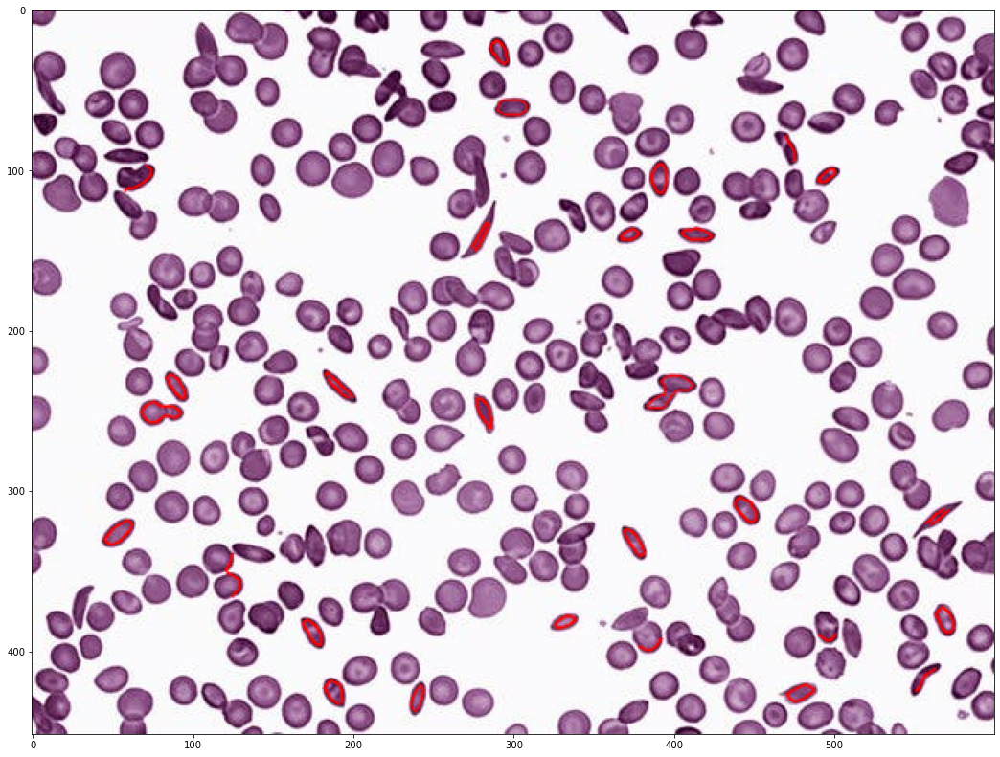

In [13]:
img_rgb3 = img_rgb.copy() #make a copy of img_rgb to draw identified sickle_shaped contours

for key, value in ecc_items.items():  
    if value[1]<250 and value[2]<100 and 0.3<value[3]<1.1: # the values for area, arclength and eccentricity were selected using trial and error. If roundness ('k' ) was used instead of arclength, then specify value[2]>1.1
        cv2.drawContours(img_rgb3, [value[0]], 0, (255,0,0), thickness=1, lineType=cv2.LINE_AA)
        
plt.figure(figsize=(18,15))
plt.imshow(img_rgb3)

For the values selected above for contour areas, contour lengths (arclength) and eccentricities, we were able to identify a large proportion of sickle-shaped blood cells (approximately 20). Presumably 'normal and round' cells have been excluded. There were however several mis-identifications when several cells were clumped together. Those sickle-shaped cells that were not identified are likely too close to other cells and were not sufficiently separated in the eroded image. It must be kept in mind that an eroded binary image was used to generate the contours and image moments, the corresponding area and arclength values are therefore not representative of actual values from the original image. 

# Implementation of Circle Hough Transform method to identify circular (normal) cells
I tried this method to identify 'normal and round' blood cells and since it was utilized by Alzubaidi et al (2020). This method in OpenCV however is not able to identify elliptical shapes and therefore a subtraction will need to be applied to isolate the abnormal cells.

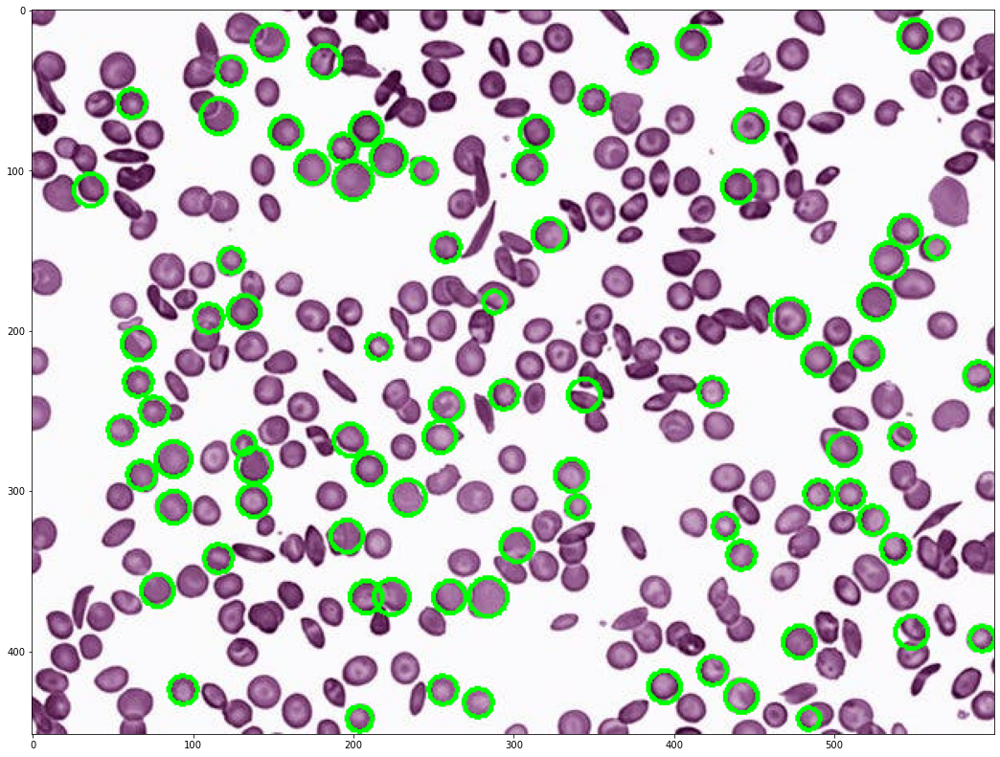

In [15]:
img_rgb4 = img_rgb.copy() #create a copy of the colour image to draw circles


circles = cv2.HoughCircles(gblur, method=cv2.HOUGH_GRADIENT, 
                           dp=1, minDist=5, param1=50, param2=30, minRadius=0, maxRadius=30) #tweak the parameters to get ideal cell identification with acceptable radii

detected_circles = np.uint16(np.around(circles))
for (x, y, r) in detected_circles[0,:]:
    cv2.circle(img_rgb4, (x,y), r, (0,255,0), 2) #draw the circles in green
    
    
plt.figure(figsize=(18,15))
plt.imshow(img_rgb4)

The Circle Hough Transform method identified many near-circular cells but also failed to identify many other similar cells. Due to its failure to identify circles that are less circular (but not elliptical) it would be difficult to use this method to identify sickle cells by applying an image subtraction similar to that described by Alzubaidi et al (2020). Due to cell crowding, a simple subtraction of the circular cells will not result in isolating sickle cells in the image selected for analysis.  

# Implementation of Watershed algorithm to segment cells

## Identify 'sure background' using dilation

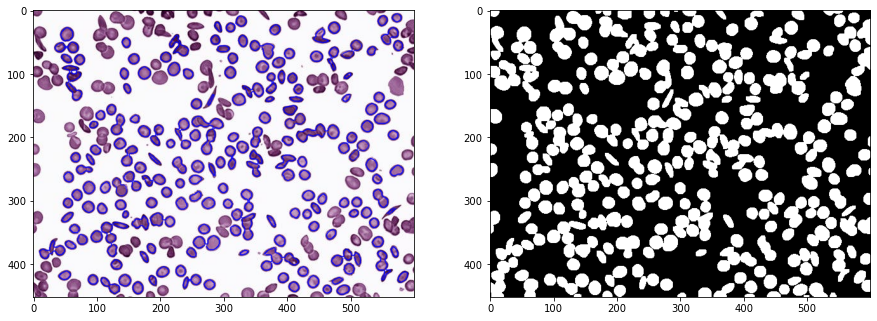

In [16]:
sure_bg = cv2.dilate(eroded, kernel, iterations = 2) #use the eroded image created above

plot_img (img_rgb2, sure_bg)
# we can be certain that the background with pixel value=0 is definitely the background

## Identify 'sure foreground' using distance transformation

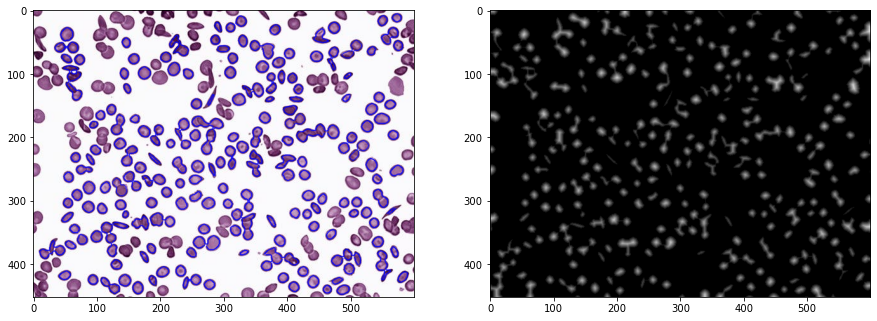

In [17]:
dist_trans = cv2.distanceTransform(eroded, cv2.DIST_L2,5)#use eroded 
plot_img (img_rgb2, dist_trans)
# in the dist_trans image, the bright areas signify the centre of each identified cell and the pixel values gradually approach 0
# at the boundary 

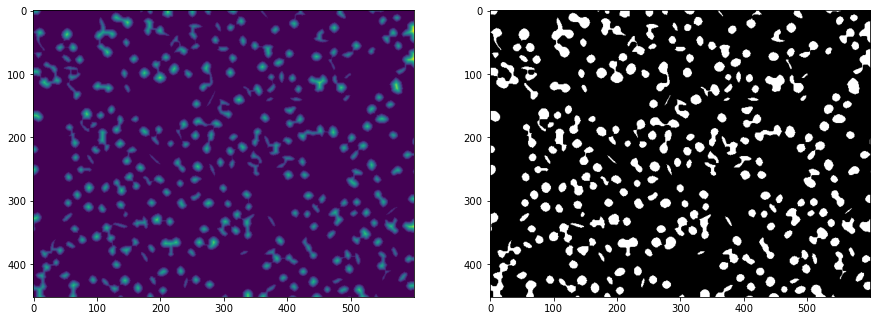

In [21]:
#threshold dist_trans by varying the fraction of max intensity as the threshold
# the brightest regions of the cells are transformed to pixel value of 255 (foregrond) and the rest to 0 (background)

ret, sure_fg = cv2.threshold(dist_trans, 0.1*dist_trans.max(), 255, 0)
plot_img (dist_trans, sure_fg)
# 0.1 times the max value of dist_transform worked in creating the seeds for the watershed algorithm
#we have identified the very centres of the red blood cells. However, the seeds are evidently too large. But
# a larger fraction would have eliminated the abnormal sickle-shaped cells because of their small size and weak distance transformed
# pixel values

In [22]:
#convert sure_fg values to unsigned int 8
sure_fg = np.uint8(sure_fg)

## Identify the 'unknown' region

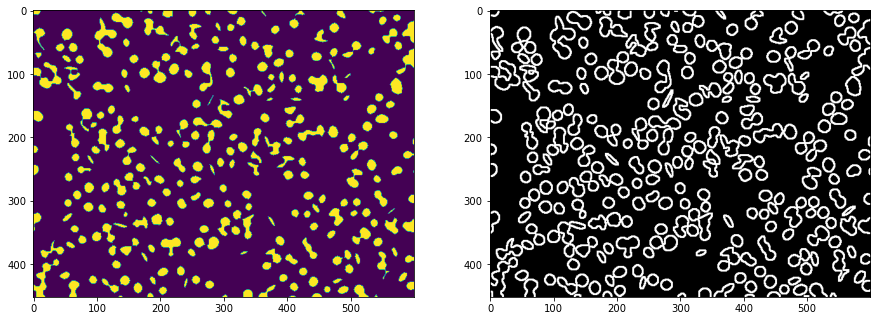

In [23]:
#unknown regions are the differences between sure_bg and sure_fg
#the cell boundaries lie within this unknown region

unknown = cv2.subtract(sure_bg, sure_fg)
plot_img (sure_fg, unknown)

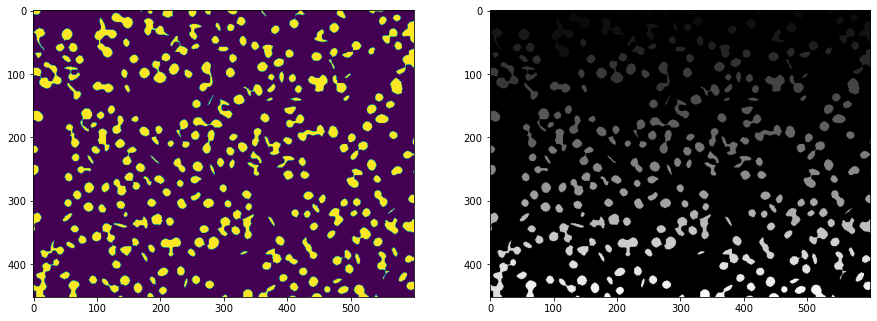

In [24]:
# now create a markers array which can label the regions of the image
# for sure_bg and sure_fg, regions will be labeled with a positive number
# unknown regions will be labeled with 0

# cv2 connected components algorithm detects pixel connectivity to identify groups of connected pixels
# each of these groups (components) are then labeled with a graylevel intensity

ret2, markers = cv2.connectedComponents(sure_fg)

plot_img (sure_fg, markers)

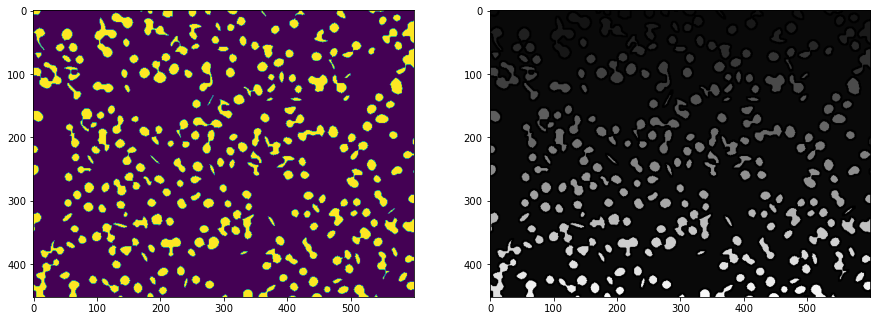

In [25]:
# in markers array, the entire background pixel value is 0. Therefore watershed algorithm will consider this to be 'unknown' regions
# to prevent this, add 10 to all the values in the markers so that background is 10 (not 0)

markers +=10

# now in the markers array, convert the pixel values where the corresponding unknown values are 255, to 0

markers[unknown==255] = 0 

plot_img (sure_fg, markers)
# the values of the background is not 0, so it takes on a grey hue
#the unknown areas are however at pixel value of 0

## Watershed algorithm

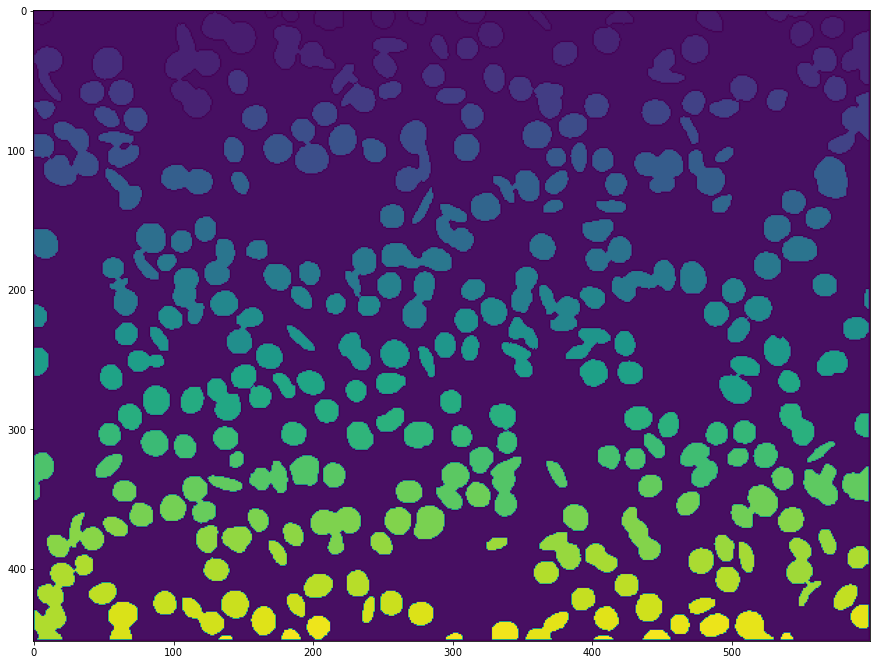

In [26]:
markers2 = cv2.watershed(img_rgb, markers)

plt.figure(figsize=(15,12))
plt.imshow(markers2)

# here there is good segmentation of normal and abnormal blood cells. The sickle cells that are isolated are clearly visible.
# however, there continues to be many overlapping cells and cells in close proximity

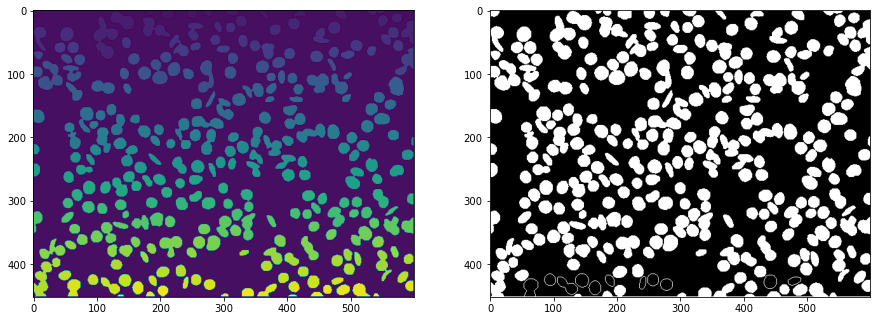

In [27]:
#convert markers2 to uint8 dtype
markers3 = np.uint8(markers2)

#binary threshold the markers3 image
ret2, thresh2 = cv2.threshold(markers3, 10, 255, cv2.THRESH_BINARY) 
plot_img (markers2, thresh2)

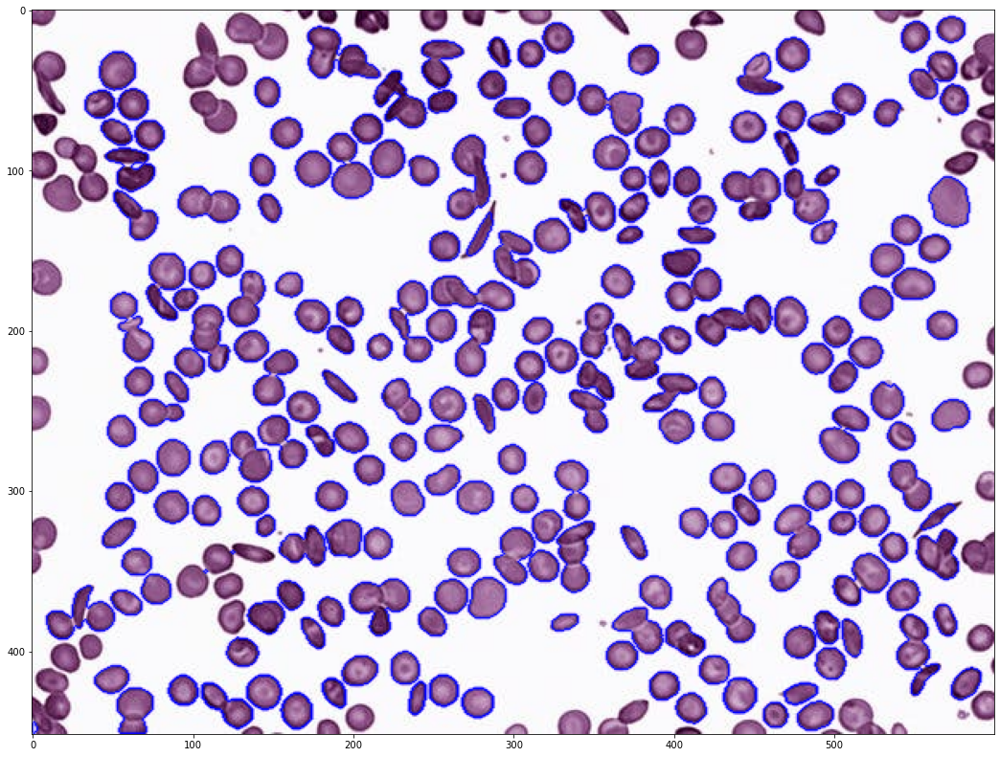

In [28]:
#find contours of the Watershed segmented cells

img_rgb3 = img_rgb.copy() #make a copy of img_rgb to draw contours

contours2,hierarchy = cv2.findContours(thresh2, 1, 2) # find contours in the clr_border image

areas = {} #create an empty dict to hold contour and area values

for i in range(len(contours2)): #loop through the number of contours
    if 0<cv2.moments(contours2[i])['m00']<1000: #if the area value (image moment 'm00')is less than ?? pixel sq
        areas[i]= (cv2.moments(contours2[i])['m00'], contours2[i]) # add the contour area and contour array to the areas ditionary

for key, value in areas.items():
    cv2.drawContours(img_rgb3, [value[1]], 0, (0,0,255), thickness=1, lineType=cv2.LINE_AA) #draw each of the contours onto the original colour image
    

plt.figure(figsize=(18,15))
plt.imshow(img_rgb3)

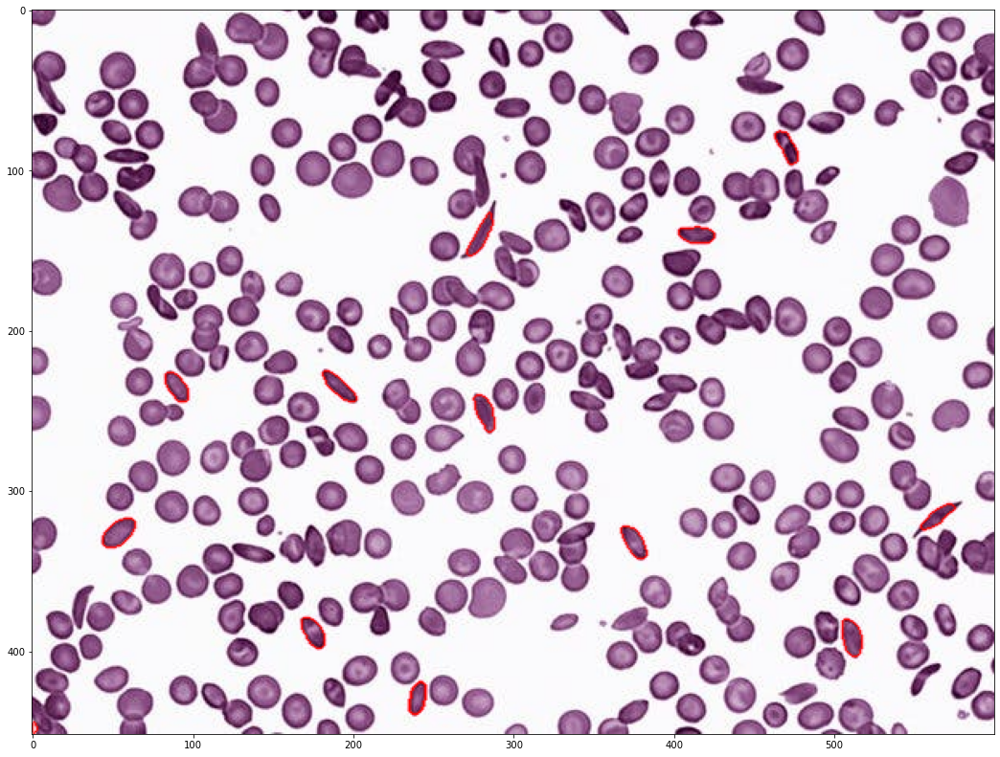

In [29]:
#determine circularity and eccentricity of cells with contours

ecc_items = {}

for i in range(len(contours2)):
    try:
        #determine the perimeter of the contours and then calculate 'roundness'
        length = cv2.arcLength(contours2[i],False) #estimate the perimeter of the contour
        k = (length*length)/((cv2.moments(contours2[i])['m00'])*4*np.pi) # eqn for roundness (inverse of circularity). Roundness is 1 for perfect circles and greater than 1 for no-circular shapes
        
        #determine the moments required to estimate the ecccentricity
        mu_20 = cv2.moments(contours2[i])['mu20']
        mu_02 = cv2.moments(contours2[i])['mu02']
        mu_11 = cv2.moments(contours2[i])['mu11']

        ecc = ((mu_20-mu_02)**2 + 4*mu_11**2)/(mu_20+mu_02)**2 #eqn for eccentricity
        
        # input all emasurements to the ecc_items dictionary
        ecc_items[i] = (contours2[i],cv2.moments(contours2[i])['m00'], length, ecc) #here instead of arclength, roundness 'k' can be used as a value for selecting sickle cells
    except:
        continue
        
        
#Identify sickle cells

img_rgb4 = img_rgb.copy() #make a copy of img_rgb to draw identified sickle_shaped contours

for key, value in ecc_items.items():  
    if value[1]<250 and value[2]<100 and 0.3<value[3]<1.1: # the values for area, arclength and eccentricity were selected using trial and error. If roundness ('k' ) was used instead of arclength, then specify value[2]>1.1
        cv2.drawContours(img_rgb4, [value[0]], 0, (255,0,0), thickness=1, lineType=cv2.LINE_AA)
        
plt.figure(figsize=(18,15))
plt.imshow(img_rgb4)

The number of sickle cells identified (approximately 12) using this method of segmentation was fewer than the first attempt. However, adjusting the filtering criteria for area, roundness and eccentricity may improve the identification of the abnormal cells. 

# Concluding Remarks  
   
1) The code in this notebook as an attempt to follow the methodology of a published book chapter where sickle cells could be distinguished from normal red blood cells.   
2) Using image moments and estimating the roundness and eccentricity of isolated cells, it was possible to identify sickle cells in the blood film. This approach is more robust in identifying the abnormal cells compared to Circle Hough Transform method.    
3) Segmenting the blood cells first using the Watershed algorithm and then by using image moments to estimate the roundness and eccentricity yielded a similar result in sickle cell identification.   
4) The greatest challenge in identifying all the sickle cells in the selected image arise from the fact that there is poor separation of the cells. Sickle cells clumped together with normal cells could not be identified.      
5) In blood films with sufficient cell separation, the code could be easily adjusted to calculate the diameters and areas of various blood cells with accuracy. Furthermore, we could also quantify the proportion of blood cells that are of sickle cell type compared to normal red blood cells giving an idea about the severity of the disorder.   

# Reference
Alzubaidi, Laith, Fadhel, Mohammed, Al-Shamma, Omran, & Zhang, Jinglan (2020) Robust and efficient approach to diagnose sickle cell anemia in blood. In Cherukuri, Aswani Kumar, Abraham, Ajith, Gandhi, Niketa, & Melin, Patricia (Eds.) Intelligent Systems Design and Applications: 18th International Conference on Intelligent Systems Design and Applications (ISDA 2018), Volume 1 (Advances in Intelligent Systems and Computing, Volume 940). Springer, Switzerland, pp. 560-570.